In [40]:
import pandas as pd
from tqdm import tqdm
import numpy as np

In [4]:
q = pd.read_pickle('llm/only_q.pkl')
q = q[q.dataset == 'bench']

In [3]:
from mirage.index.chunk_storages import ChunkStorage, WhooshChunkStorage
from mirage.inference.quorums import RusVectoresQuorum


chunk_storage = WhooshChunkStorage(scoring_function='BM25F')
quorum = RusVectoresQuorum(
    path_to_model='model.bin',
    chunk_storage=chunk_storage,
    relative_cosine_similarity_strategy=True,
    inv_mode=True
)

called_amounts = []
logs_of_replacements = []

In [4]:
# from tqdm import tqdm


# for question_text in tqdm(q.question):
#     results, called, logs = quorum.query(question_text)
#     called_amounts.append(called)
#     logs_of_replacements.append(logs)

In [5]:
import os


path_bench = 'E:/indexes1'
files_bench = [fr'{path_bench}/{i}' for i in os.listdir(path_bench) if 'l2' in i and 'intfloat' in i]

In [6]:
from mirage.index.MirageIndex import MirageIndex

file_names = []
question_ids = []
called_amounts = []
logs_of_replacements = []
pure_results = []
syn_results = []

pb = tqdm(total = len(files_bench) * len(q))
for filename in files_bench:
    temp_called_amounts = []
    temp_logs_of_replacements = []
    temp_pure_results = []
    temp_syn_results = []
    index = MirageIndex.load(filename)
    quorum.chunk_storage = index.chunk_storage
    for idx, question_text in enumerate(q.question):
        pure_result = index.chunk_storage.query(question_text)
        # print(pure_result)
        pure_texts = index.chunk_storage.get_texts_for_search_results(pure_result)
        # temp_pure_results.append(pure_texts)

        syn_result, called, logs = quorum.query(question_text)
        # temp_syn_results.append(index.chunk_storage.get_texts_for_search_results(syn_result))

        # temp_called_amounts.append(called)
        # temp_logs_of_replacements.append(logs)

        pb.update()

        file_names.append(filename)
        question_ids.append(idx)
        called_amounts.append(called)
        logs_of_replacements.append(logs)
        pure_results.append(pure_texts)
        syn_results.append(index.chunk_storage.get_texts_for_search_results(syn_result))

100%|██████████| 2400/2400 [08:14<00:00,  4.19it/s]

In [7]:
new = pd.DataFrame([file_names, question_ids, called_amounts, logs_of_replacements, pure_results, syn_results]).transpose()
new.columns = ['file_names', 'question_ids', 'called_amounts', 'logs_of_replacements', 'pure_results', 'syn_results']

In [ ]:
# new.to_pickle('E:/syn.pkl')

In [1]:
from tqdm import tqdm
import pandas as pd
tqdm.pandas()

In [2]:
df = pd.read_pickle('E:/syn.pkl')

In [5]:
df = pd.merge(df, q.reset_index(), left_on='question_ids', right_on='index')

In [6]:
df

,file_names,question_ids,called_amounts,logs_of_replacements,pure_results,syn_results,index,doc,question,response,rel_sent,dataset
0,E:/indexes1/S_16_0.1_intfloat_l2.mirage_index,0,1,[{}],[МИНИСТЕРСТВО ТРАНСПОРТА РОССИЙСКОЙ ФЕДЕРАЦИ...,[МИНИСТЕРСТВО ТРАНСПОРТА РОССИЙСКОЙ ФЕДЕРАЦИ...,0,ФАП-29.txt,Какие основные мероприятия по предупреждению а...,Основные мероприятия включают: соблюдение проп...,6. Основными мероприятиями по предупреждению а...,bench
1,E:/indexes1/S_16_0.1_intfloat_l2.mirage_index,1,2,"[{}, {10: 0}]","[""д) досмотр пассажиров, членов экипажей г...","[""д) досмотр пассажиров, членов экипажей г...",1,ФАП-29.txt,Какие меры авиационной безопасности должны быт...,При базировании вне аэропорта эксплуатант АОН ...,8. При базировании (временной стоянке) воздушн...,bench
2,E:/indexes1/S_16_0.1_intfloat_l2.mirage_index,2,2,"[{}, {2: 0}]",[МИНИСТЕРСТВО ТРАНСПОРТА РОССИЙСКОЙ ФЕДЕРАЦИ...,[МИНИСТЕРСТВО ТРАНСПОРТА РОССИЙСКОЙ ФЕДЕРАЦИ...,2,ФАП-29.txt,Какие обязанности возложены на командира возду...,Командир воздушного судна обязан пройти специа...,13. Командир воздушного судна руководит работо...,bench
3,E:/indexes1/S_16_0.1_intfloat_l2.mirage_index,3,2,"[{}, {6: 0}]","[""д) досмотр пассажиров, членов экипажей г...","[""д) досмотр пассажиров, членов экипажей г...",3,ФАП-29.txt,Какие требования предъявляются к стоянкам возд...,Стоянки воздушных судов АОН не должны находить...,10. Стоянки воздушных судов эксплуатантов АОН ...,bench
4,E:/indexes1/S_16_0.1_intfloat_l2.mirage_index,4,1,[{}],"[111. КОМАНДИР ВОЗДУШНОГО СУДНА АОН\r\n""13. Ко...","[111. КОМАНДИР ВОЗДУШНОГО СУДНА АОН\r\n""13. Ко...",4,ФАП-29.txt,Какие действия должен предпринять командир воз...,"Командир обязан передать сигналы бедствия, соо...","17. При АНВ, произошедшем в полете, командир в...",bench
...,...,...,...,...,...,...,...,...,...,...,...,...
2395,E:/indexes1/W_512_0.5_intfloat_l2.mirage_index,75,4,"[{}, {10: 0}, {4: 0}, {10: 0, 4: 0}]",[при осуществлении космической деятельности по...,[при осуществлении космической деятельности по...,75,ФАП-138.txt,Какие классы воздушного пространства установле...,Над территорией Российской Федерации установле...,"а) класс А - разрешаются полеты, выполняемые т...",bench
2396,E:/indexes1/W_512_0.5_intfloat_l2.mirage_index,76,4,"[{}, {2: 0}, {7: 0}, {2: 0, 7: 0}]",[воздушного судна в контролируемое воздушно...,[воздушного судна в контролируемое воздушно...,76,ФАП-138.txt,Какие меры применяются к воздушным судам-наруш...,К воздушным судам-нарушителям применяются меры...,При выявлении воздушного судна-нарушителя орга...,bench
2397,E:/indexes1/W_512_0.5_intfloat_l2.mirage_index,77,2,"[{}, {4: 0}]",[пользователей воздушного пространства разреше...,[пользователей воздушного пространства разреше...,77,ФАП-138.txt,Какие требования предъявляются к использованию...,Использование воздушного пространства беспилот...,Использование воздушного пространства беспилот...,bench
2398,E:/indexes1/W_512_0.5_intfloat_l2.mirage_index,78,1,[{}],"[""""б"""" - """"г"""" пункта""\r\n""39 настоящих ...","[""""б"""" - """"г"""" пункта""\r\n""39 настоящих ...",78,ФАП-138.txt,Какие зоны устанавливаются в воздушном простра...,В воздушном пространстве Российской Федерации ...,Запретные зоны устанавливаются в воздушном про...,bench


In [7]:
def calculate_relevance(r, c):
    context = set(c.split())
    res = []
    for i in r:
        model = set(i.split())

        value = len(context & model) / len(context | model)
        try:
            normalized = value * (max(len(model), len(context)) / min(len(model), len(context)))
        except ZeroDivisionError:
            normalized = 0

        res.append(normalized)
    return res

df['relevance_pure'] = df.progress_apply(lambda x: calculate_relevance(x['pure_results'], x['rel_sent']), axis=1)
df['relevance_syn'] = df.progress_apply(lambda x: calculate_relevance(x['syn_results'], x['rel_sent']), axis=1)

100%|██████████| 2400/2400 [00:02<00:00, 960.27it/s] 


In [8]:
df['relevance_pure_mean'] = df['relevance_pure'].apply(lambda x: sum(x)/len(x))
df['relevance_syn_mean'] = df['relevance_syn'].apply(lambda x: sum(x)/len(x))

In [ ]:
# df.to_pickle('E:/syn.pkl')

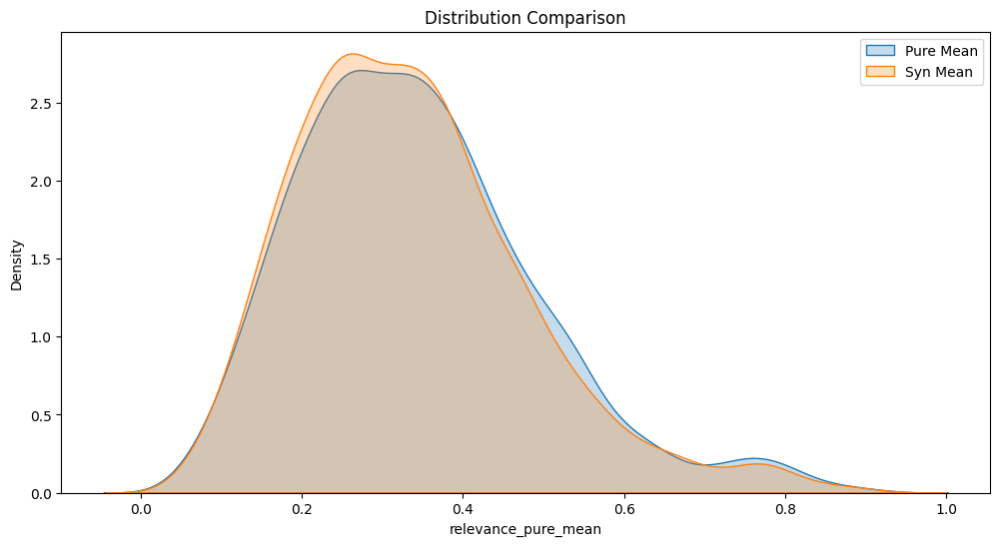

In [33]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(12, 6))
sns.kdeplot(data=df, x='relevance_pure_mean', label='Pure Mean', fill=True)
sns.kdeplot(data=df, x='relevance_syn_mean', label='Syn Mean', fill=True)
plt.title('Distribution Comparison')
plt.legend()
plt.show()

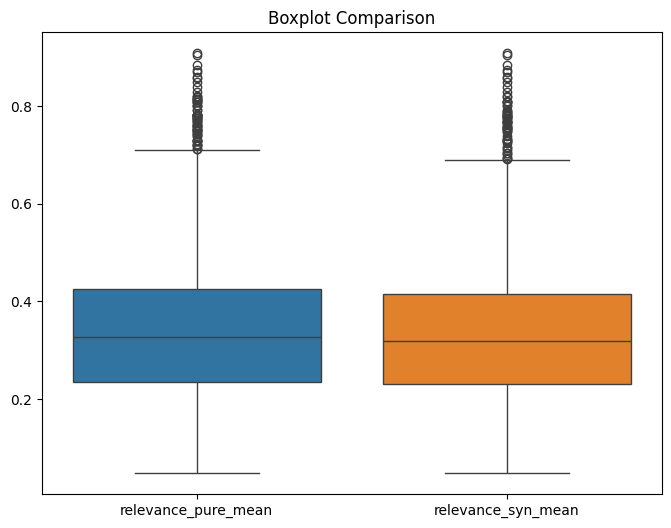

In [34]:
plt.figure(figsize=(8, 6))
sns.boxplot(data=df[['relevance_pure_mean', 'relevance_syn_mean']])
plt.title('Boxplot Comparison')
plt.show()

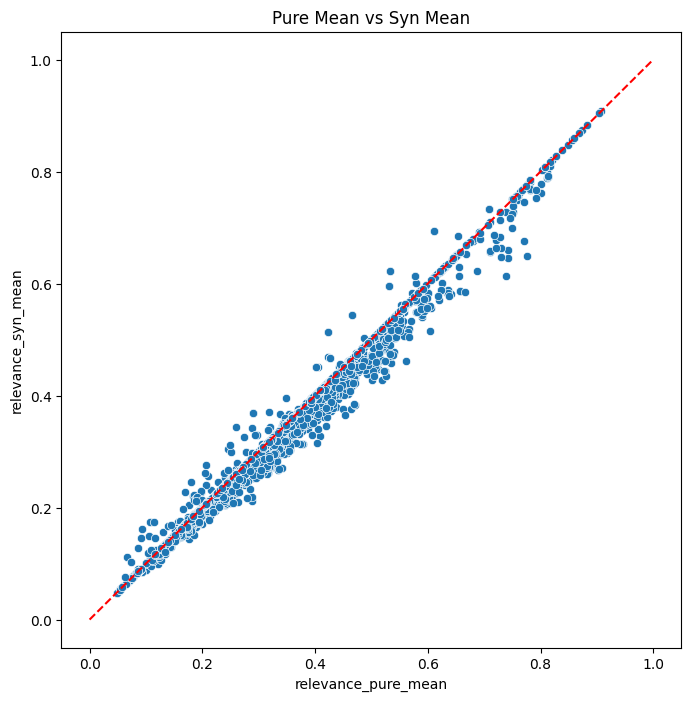

In [35]:
plt.figure(figsize=(8, 8))
sns.scatterplot(data=df, x='relevance_pure_mean', y='relevance_syn_mean')
plt.plot([0, 1], [0, 1], 'r--')  # Линия y=x для сравнения
plt.title('Pure Mean vs Syn Mean')
plt.show()

In [42]:
from scipy.stats import ttest_rel

t_stat, p_value = ttest_rel(df['relevance_pure_mean'], df['relevance_syn_mean'])
print(f"T-statistic: {t_stat:.3f}, p-value: {p_value}")

T-statistic: 20.175, p-value: 9.687972278818555e-84


In [43]:
from scipy.stats import wilcoxon

w_stat, p_value = wilcoxon(df['relevance_pure_mean'], df['relevance_syn_mean'])
print(f"Wilcoxon statistic: {w_stat}, p-value: {p_value}")

Wilcoxon statistic: 80844.0, p-value: 1.1177074010343145e-104


In [45]:
from scipy.stats import shapiro

_, p_pure = shapiro(df['relevance_pure_mean'])
_, p_syn = shapiro(df['relevance_syn_mean'])
print(f"Shapiro-Wilk p-value (pure): {p_pure}, (syn): {p_syn}")

Shapiro-Wilk p-value (pure): 3.144465398163308e-24, (syn): 2.2365820206793453e-25


In [41]:
def cohen_d(x, y):
    nx = len(x)
    ny = len(y)
    dof = nx + ny - 2
    return (x.mean() - y.mean()) / np.sqrt(((nx-1)*x.std()**2 + (ny-1)*y.std()**2) / dof)

d = cohen_d(df['relevance_pure_mean'], df['relevance_syn_mean'])
print(f"Cohen's d: {d:.3f}")

Cohen's d: 0.054
